In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd 
import sys 

sys.path.append("../../tools")
from plot_tools import plot_uv_map,plot_map_zoom,plot_map_zoom_only

#result_filepath = "/Odyssey/private/t22picar/data/ssh_L4/NeurOST_SSH-SST_allsat-al_2019_4th_mdt.nc"
specific_time = '2019-01-01'

result_filepath = "/Odyssey/private/t22picar/data/ssh_L4/SSH_L4_CMEMS_2019_4th.nc"
ssh_duacs = xr.open_dataset(result_filepath).sel(time=specific_time)

result_filepath = "/Odyssey/private/t22picar/data/sst_L4/SST_L4_OSTIA_2019_4th.nc"
sst_duacs = xr.open_dataset(result_filepath).sel(time=specific_time)

result_filepath = "/Odyssey/private/t22picar/data/sst_L4/SST_L4_OSTIA_2019.nc"
sst_raw = xr.open_dataset(result_filepath).sel(time=specific_time)
sst_raw = sst_raw.rename({'longitude': 'lon'})
sst_raw = sst_raw.rename({'latitude': 'lat'})
sst_raw = sst_raw.rename({'analysed_sst': 'thetao'})

result_filepath = "/Odyssey/private/t22picar/data/sst_L4/mur/20190101090000-JPL-L4_GHRSST-SSTfnd-MUR-GLOB-v02.0-fv04.1.nc"
sst_mur = xr.open_dataset(result_filepath).sel(time=specific_time)
sst_mur = sst_mur.rename({'analysed_sst': 'thetao'})

folder_data_4th = "/Odyssey/private/t22picar/data/glorys_15m/glorys_15.81m_2019-01-01-2020-01-01.nc"
#folder_data_4th = "/Odyssey/public/glorys/reanalysis/glorys12_2010_2019_4th.nc"
ssh_glorys = xr.open_dataset(folder_data_4th).sel(time=specific_time) 
ssh_glorys = ssh_glorys.rename({'longitude': 'lon'})
ssh_glorys = ssh_glorys.rename({'latitude': 'lat'})

lat = ssh_duacs.lat.values
lon = ssh_duacs.lon.values

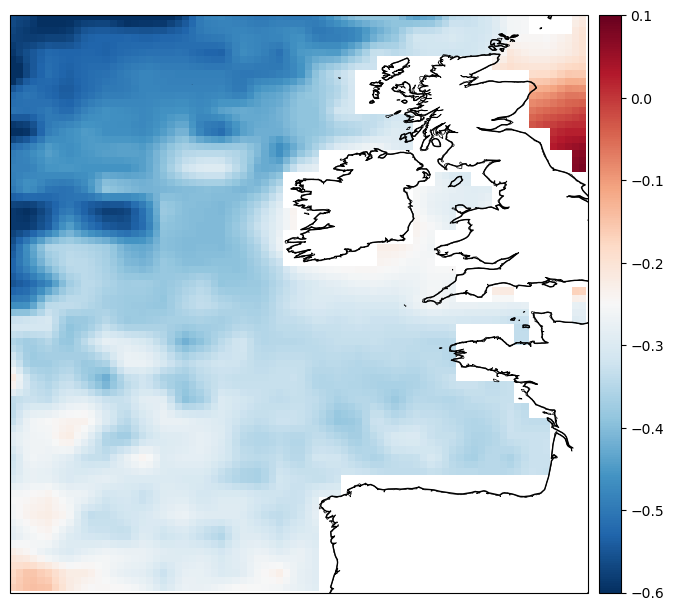

In [67]:
coa_coef = 8 #12/coef = res

# Sous-échantillonner en prenant une latitude sur deux
subset = ssh_glorys.isel(lat=slice(None, None, coa_coef))
subset = subset.isel(lon=slice(None, None, coa_coef))

subset = subset.interp({"lat":lat, "lon":lon}, method="linear")

plot_map_zoom_only(subset.zos,subset.lon,subset.lat,vmin=-0.6,vmax=0.1)

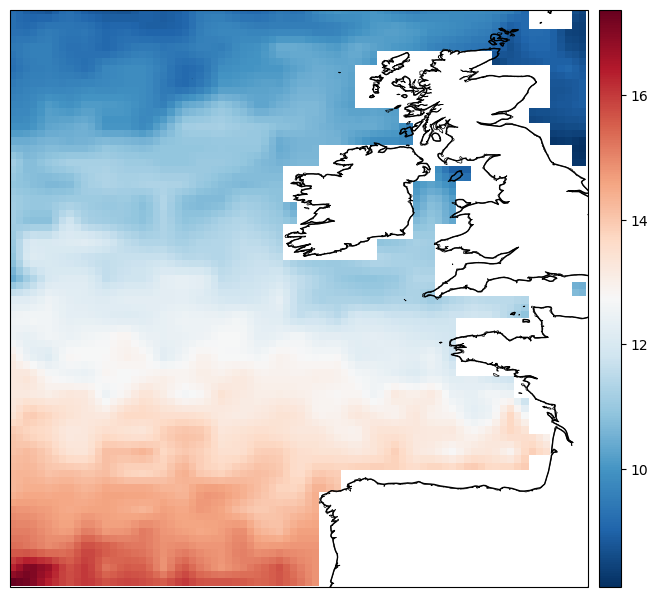

In [71]:
plot_map_zoom_only(subset.thetao[0],subset.lon,subset.lat)

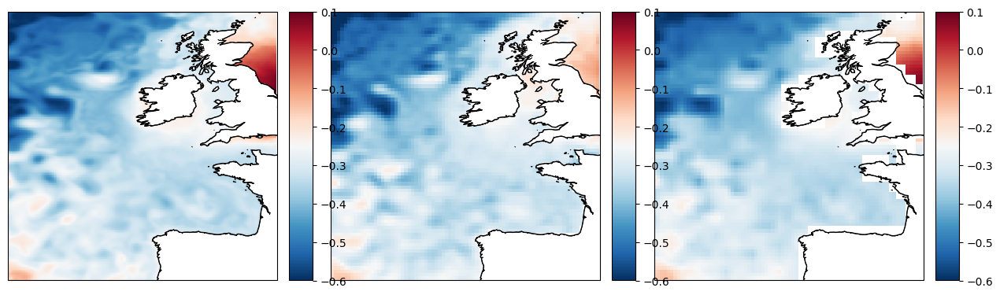

In [68]:
# Créer une figure avec trois sous-figures
#fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 ligne, 3 colonnes
import cartopy.crs as ccrs
fig, axs = plt.subplots(nrows=1,ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(15*1,7.5*1))

plot_map_zoom_only(ssh_glorys.zos,ssh_glorys.lon,ssh_glorys.lat,vmin=-0.6,vmax=0.1,axs=axs[0],fig=fig)

plot_map_zoom_only(ssh_duacs.zos,lon,lat,vmin=-0.6,vmax=0.1,axs=axs[1],fig=fig)

plot_map_zoom_only(subset.zos,subset.lon,subset.lat,vmin=-0.6,vmax=0.1,axs=axs[2],fig=fig)

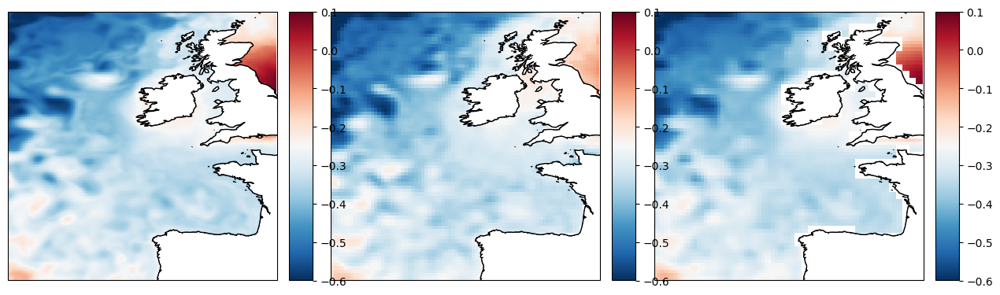

In [66]:
# Créer une figure avec trois sous-figures
#fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 ligne, 3 colonnes
import cartopy.crs as ccrs
fig, axs = plt.subplots(nrows=1,ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(15*1,7.5*1))

plot_map_zoom_only(ssh_glorys.zos,ssh_glorys.lon,ssh_glorys.lat,vmin=-0.6,vmax=0.1,axs=axs[0],fig=fig)

plot_map_zoom_only(ssh_duacs.zos,lon,lat,vmin=-0.6,vmax=0.1,axs=axs[1],fig=fig)

plot_map_zoom_only(subset.zos,subset.lon,subset.lat,vmin=-0.6,vmax=0.1,axs=axs[2],fig=fig)


In [81]:
sst_raw

<xarray.Dataset> Size: 207MB
Dimensions:       (latitude: 3600, longitude: 7200)
Coordinates:
  * latitude      (latitude) float32 14kB -89.97 -89.93 -89.88 ... 89.93 89.97
  * longitude     (longitude) float32 29kB -180.0 -179.9 -179.9 ... 179.9 180.0
    time          datetime64[ns] 8B 2019-01-01
Data variables:
    analysed_sst  (latitude, longitude) float64 207MB ...
Attributes:
    Conventions:               CF-1.4, ACDD-1.3
    title:                     Global SST & Sea Ice Analysis, L4 OSTIA, 0.05 ...
    source:                    AMSR2-REMSS-L2P-v2.0, AMSRE-REMSS-L2P-v2.0, GO...
    institution:               UKMO
    references:                Donlon, C.J., Martin, M., Stark, J.D., Roberts...
    comment:                   WARNING Some applications are unable to proper...
    history:                   Created from sst.nc; obs_anal.nc; seaice.nc
    copernicusmarine_version:  2.0.1

In [1]:
# Créer une figure avec trois sous-figures
#fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 ligne, 3 colonnes
import cartopy.crs as ccrs
fig, axs = plt.subplots(nrows=1,ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(15*1,7.5*1))

plot_map_zoom_only(ssh_glorys.thetao[0],ssh_glorys.lon,ssh_glorys.lat,vmin=8,vmax=17,axs=axs[0],fig=fig)

#plot_map_zoom_only(sst_duacs.thetao,lon,lat,vmin=8,vmax=17,axs=axs[1],fig=fig)
plot_map_zoom_only(sst_raw.thetao-273.25,sst_raw.lon,sst_raw.lat,vmin=8,vmax=17,axs=axs[1],fig=fig)

#plot_map_zoom_only(sst_mur.thetao[0]-273.25,sst_mur.lon,sst_mur.lat,vmin=8,vmax=17,axs=axs[1],fig=fig)

plot_map_zoom_only(subset.thetao[0],subset.lon,subset.lat,vmin=8,vmax=17,axs=axs[2],fig=fig)


NameError: name 'plt' is not defined

(array([0.14775362, 0.1513403 , 0.13524399, 0.12973275, 0.13515651,
        0.16953613, 0.19105619, 0.18117096, 0.16428733, 0.16472473,
        0.15343982, 0.14128011, 0.1482785 , 0.21878733, 0.3275249 ,
        0.7780466 , 0.77708432, 0.76002573, 0.48402652, 0.42803935,
        0.38351206, 0.37362683, 0.39759633, 0.45821993, 0.52890373,
        0.60369908, 0.6616108 , 0.57763005, 0.49933551, 0.42882667,
        0.40459473, 0.38631142, 0.38281222, 0.3646164 , 0.35044465,
        0.34720789, 0.36207948, 0.36435396, 0.35053213, 0.37721351,
        0.39724641, 0.37878815, 0.4182416 , 0.44046151, 0.47160436,
        0.53406504, 0.57290614, 0.59477612, 0.58392861, 0.61507147,
        0.66318544, 0.73666859, 0.69529057, 0.72039732, 0.71366136,
        0.79641739, 0.84286924, 0.85047999, 0.87794869, 0.8626397 ,
        0.87934837, 1.0231654 , 1.09918546, 1.0475723 , 0.97190215,
        0.88888369, 0.86535158, 0.85476651, 0.83219668, 0.78513247,
        0.74427934, 0.72879539, 0.72870791, 0.70

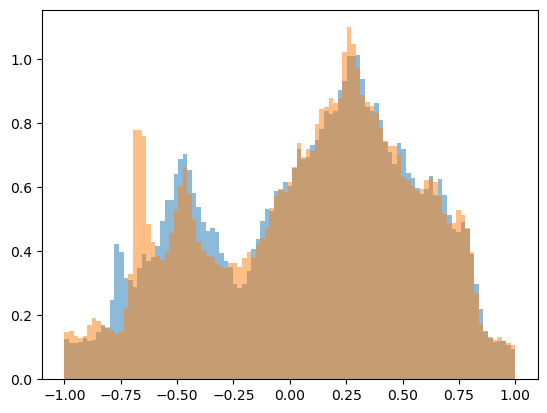

In [5]:
plt.hist(ssh_glorys.zos.values.ravel(),density=True,bins=np.linspace(-1,1,100),alpha=0.5)

plt.hist(ssh_duacs.zos.values.ravel(),density=True,bins=np.linspace(-1,1,100),alpha=0.5)

In [9]:
# Calcul de l'écart type
ecart_type_duacs = np.nanstd(ssh_duacs.zos.values)
print(ecart_type_duacs)

ecart_type_glorys = np.nanstd(ssh_glorys.zos.values)
print(ecart_type_glorys)

0.7208415278686179
0.7246224365626929


(array([0.896598  , 0.92612013, 1.04393529, 1.02562064, 0.98161079,
        0.88566388, 0.8785567 , 0.75910141, 0.72137869, 0.64292637,
        0.67326856, 0.62570513, 0.63609254, 0.59290276, 0.5833354 ,
        0.56693422, 0.62843866, 0.55326657, 0.57431475, 0.54096568,
        0.54479262, 0.53959892, 0.53139833, 0.58196864, 0.59235605,
        0.55764022, 0.5467061 , 0.5426058 , 0.55353992, 0.59262941,
        0.64948684, 0.61285753, 0.58114858, 0.58634229, 0.62843866,
        0.67080838, 0.6596009 , 0.68283591, 0.6951368 , 0.73258617,
        0.81049179, 0.82798638, 0.87336299, 0.88211029, 0.91901295,
        0.91682612, 0.91190577, 0.93158719, 0.92940036, 0.9682165 ,
        1.00566586, 1.01878681, 1.0939589 , 1.18744564, 1.09286549,
        1.05514276, 1.14890286, 1.1253945 , 1.11446038, 1.09805919,
        1.17596481, 1.27546532, 1.27273179, 1.32138863, 1.33532964,
        1.31482816, 1.33970329, 1.38316642, 1.35747124, 1.3366964 ,
        1.33450958, 1.3675853 , 1.46735916, 1.56

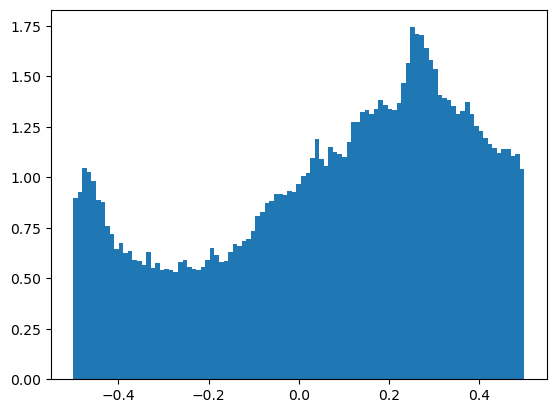

In [ ]:
plt.hist(ssh_glorys.zos.values.ravel() - ssh_duacs.zos.values.ravel(),density=True,bins=np.linspace(-0.5,0.5,100))

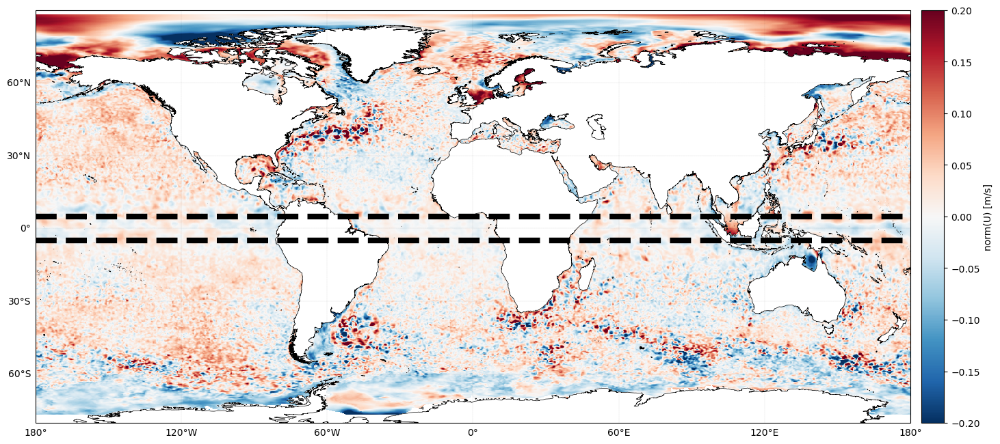

In [70]:
plot_uv_map(ssh_glorys.zos-ssh_duacs.zos,lon,lat,vmin=-0.2,vmax=0.2)

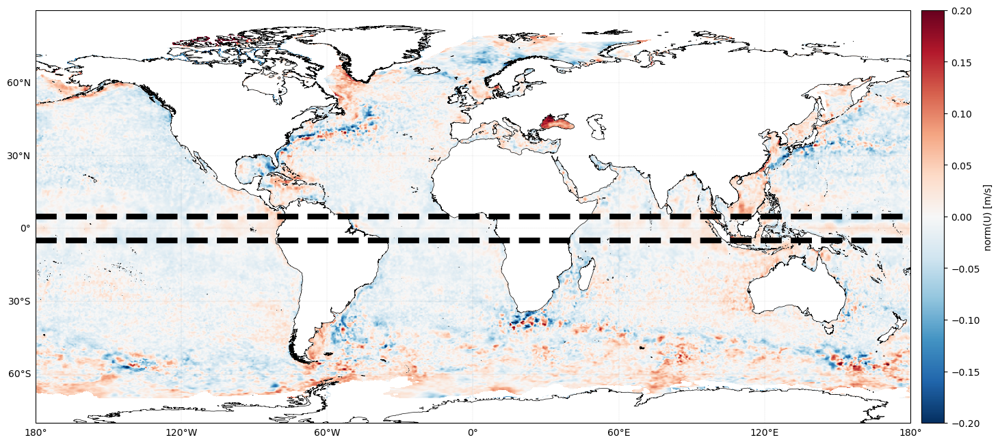

In [68]:
plot_uv_map(ssh_duacs.zos-ssh_neurost_mdt.zos,lon,lat,vmin=-0.2,vmax=0.2)

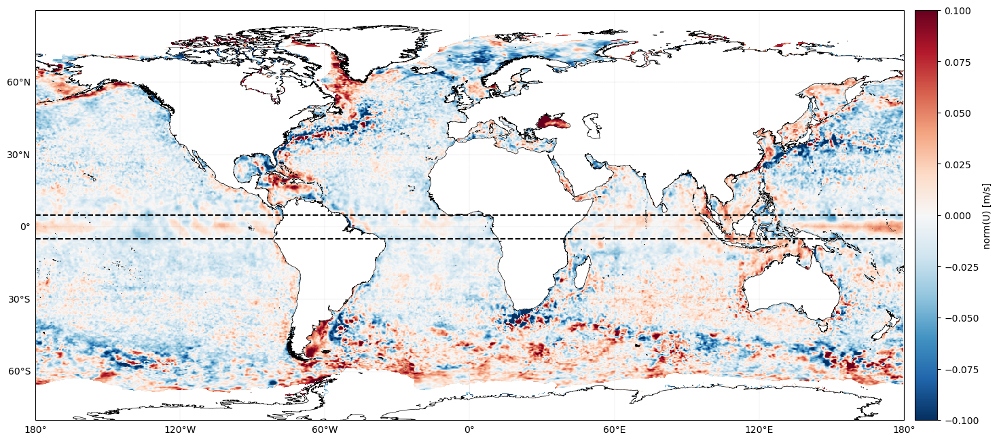

In [15]:
plot_uv_map(ssh_duacs.zos-ssh_neurost_mdt.zos,lon,lat,vmin=-0.1,vmax=0.1)

In [16]:
result_filepath = "/Odyssey/private/t22picar/data/ssh_L4/NeurOST_SSH-SST_allsat-al_2019_4th.nc"
ssh_neurost = xr.open_dataset(result_filepath)

In [ ]:
result_filepath = "/Odyssey/public/glorys/reanalysis/glorys12_2010_2019_mean_zos_4th.nc"
mdt = xr.open_dataset(result_filepath)
#mdt

<xarray.Dataset> Size: 8MB
Dimensions:   (lat: 680, lon: 1440)
Coordinates:
  * lat       (lat) float64 5kB -80.0 -79.75 -79.5 -79.25 ... 89.5 89.75 90.0
  * lon       (lon) float64 12kB -180.0 -179.7 -179.5 ... 179.4 179.7 179.9
Data variables:
    mean_zos  (lat, lon) float64 8MB ...

In [35]:
print(np.nanmean(ssh_neurost_v))
print(np.nanmean(mdt.mean_zos.values))

-0.13714608087295863
-0.15404522405640236


In [25]:
ssh_neurost_v = ssh_neurost.zos.values

(array([0.24709578, 0.11983566, 0.09852953, 0.22621649, 0.46038418,
        0.42241276, 0.72409075, 0.57810376, 0.18799078, 0.00598043]),
 array([-1.90051736, -1.57485236, -1.24918737, -0.92352237, -0.59785738,
        -0.27219238,  0.05347261,  0.37913761,  0.70480261,  1.0304676 ,
         1.3561326 ]),
 <BarContainer object of 10 artists>)

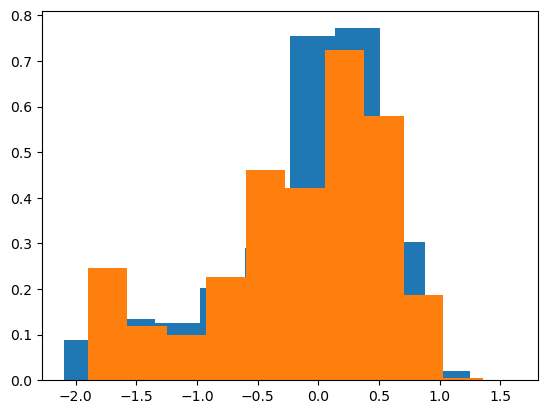

In [28]:
plt.hist(ssh_neurost_v.ravel(),density=True)
plt.hist(mdt.mean_zos.values.ravel(),density=True)

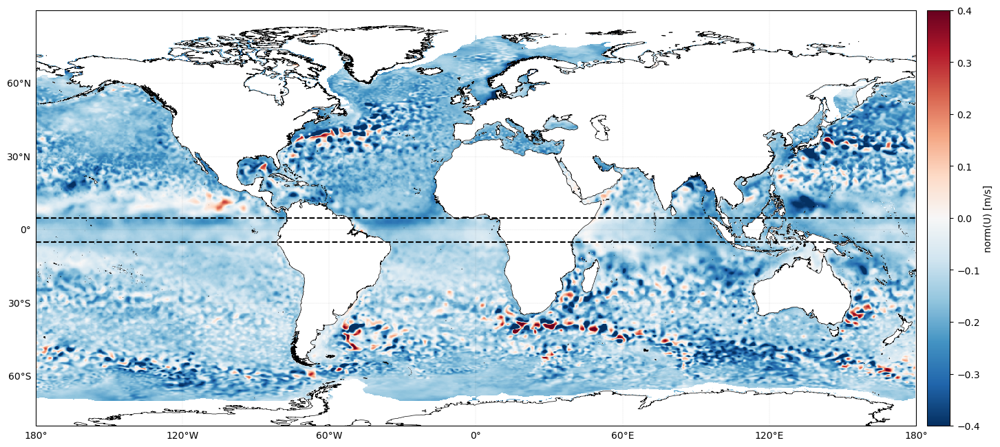

In [24]:
plot_uv_map(ssh_neurost.zos[100]-mdt.mean_zos,lon,lat,vmin=-0.4,vmax=0.4)

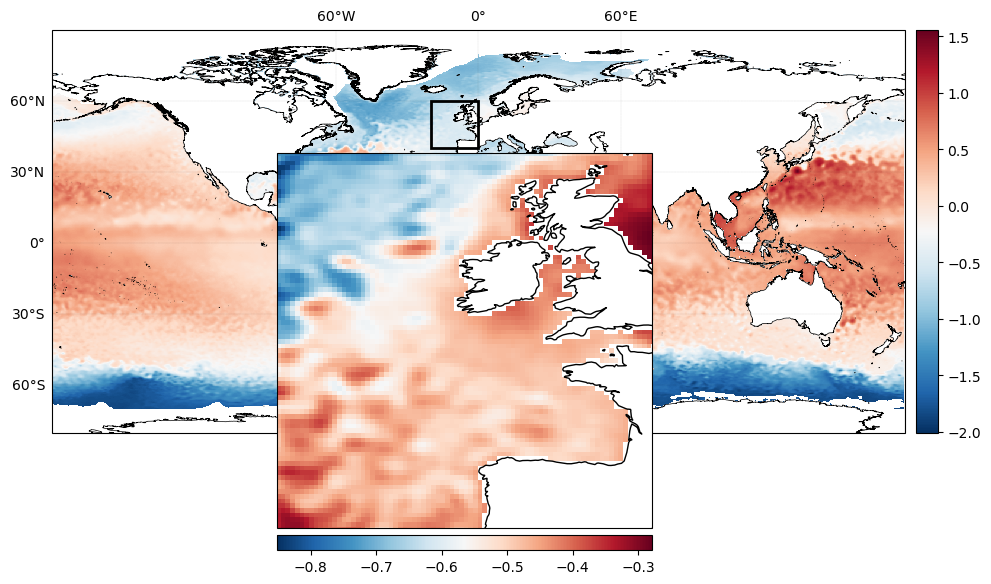

In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd 
import sys 

sys.path.append("../tools")
from plot_tools import plot_uv_map,plot_map_zoom

result_filepath = "/Odyssey/private/t22picar/data/ssh_L4/NeurOST_SSH_allsat-al_2019_4th.nc"
res_data = xr.open_dataset(result_filepath)
ssh = res_data.zos.values
lat = res_data.lat.values
lon = res_data.lon.values
plot_map_zoom(ssh[0],lon,lat)

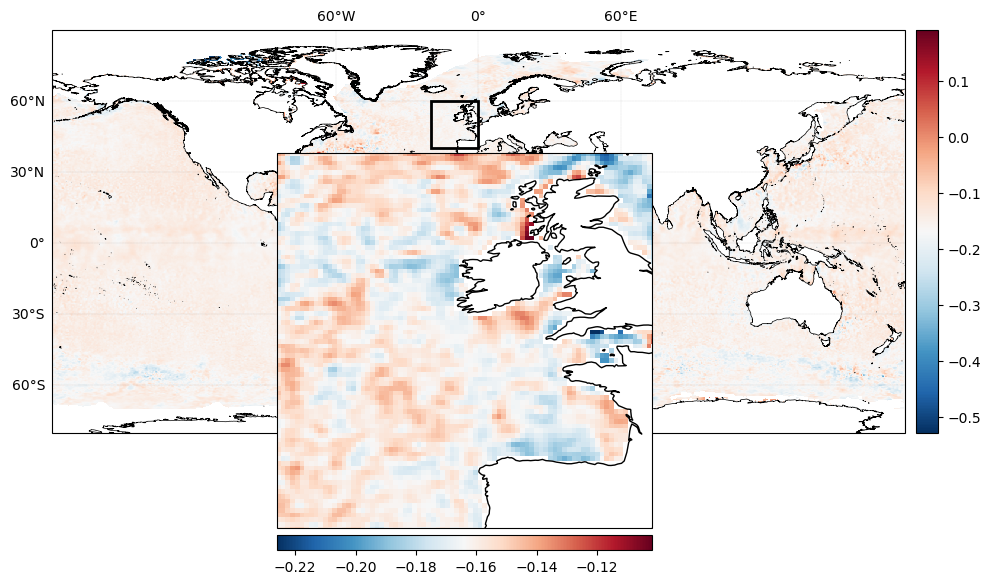

In [4]:
plot_map_zoom(ssh[0]-ssh_duacs[0],lon,lat)

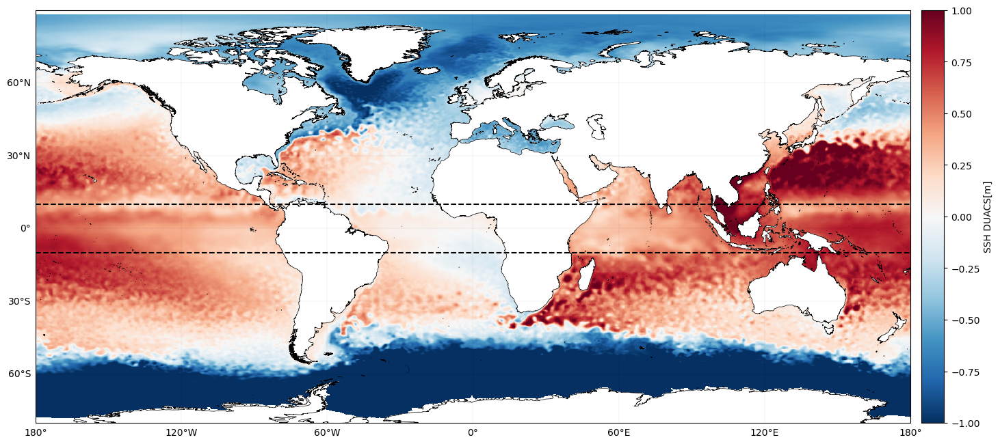

In [2]:
plot_uv_map(ssh_duacs[0],lon,lat,colorbar_title="SSH DUACS[m]")

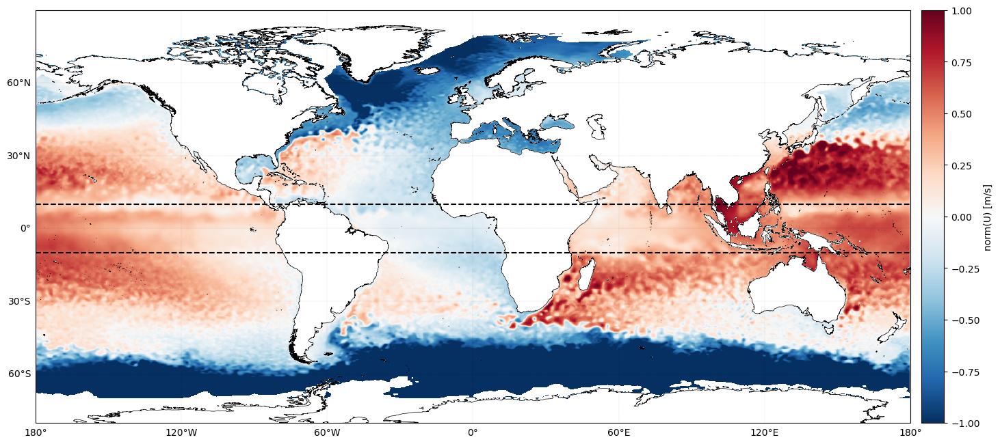

In [9]:
plot_uv_map(ssh[0],lon,lat)

In [7]:
res_uo_1.out[0]

<xarray.DataArray 'out' (lat: 680, lon: 1440)> Size: 4MB
[979200 values with dtype=float32]
Coordinates:
    time     datetime64[ns] 8B 2019-01-01
  * lat      (lat) float64 5kB -80.0 -79.75 -79.5 -79.25 ... 89.5 89.75 90.0
  * lon      (lon) float64 12kB -180.0 -179.7 -179.5 ... 179.4 179.7 179.9

<xarray.Dataset> Size: 709MB
Dimensions:  (time: 181, lat: 680, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 1kB 2019-01-01 2019-01-02 ... 2019-06-30
  * lat      (lat) float64 5kB -80.0 -79.75 -79.5 -79.25 ... 89.5 89.75 90.0
  * lon      (lon) float64 12kB -180.0 -179.7 -179.5 ... 179.4 179.7 179.9
Data variables:
    out      (time, lat, lon) float32 709MB nan nan nan nan ... nan nan nan nan

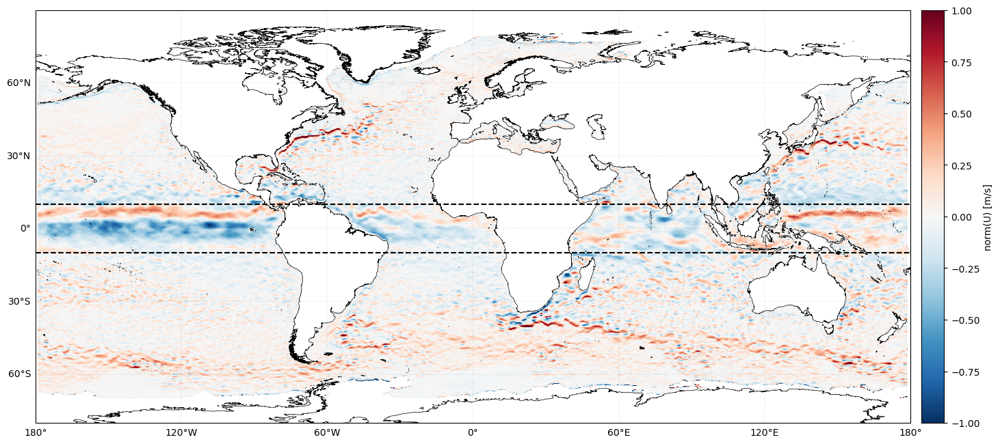

In [20]:
result_filepath = "/Odyssey/private/t22picar/4dvarnet-uv/rec/multivar_mapping_ssh_neurost_sst_wind_to_u_v_test_L4_1y/2019_global_4/test_data_dim0.nc"
res_uo_1 = xr.open_dataset(result_filepath)

# OUT ONLY
array_mask = np.isnan(ssh[:181])
uo = res_uo_1.out.values
uo = np.where(array_mask ,np.nan, uo)

plot_uv_map(uo[0],lon,lat)


In [33]:
result_filepath = "/Odyssey/private/t22picar/data/ssh_L4/NeurOST_SSH-SST_allsat-al_2019_4th.nc"
ssh_neurost = xr.open_dataset(result_filepath)

folder_data_4th = "/Odyssey/private/t22picar/data/glorys_15m/glorys_15.81m_2019-01-01-2020-01-01_4th.nc"
ssh_glorys = xr.open_dataset(folder_data_4th)

result_filepath = "/Odyssey/public/glorys/reanalysis/glorys12_2010_2019_mean_zos_4th.nc"
mdt = xr.open_dataset(result_filepath)

result_filepath = "/Odyssey/private/t22picar/data/ssh_L4/NeurOST_SSH-SST_allsat-al_2019_4th_mdt.nc"
ssh_neurost_mdt = xr.open_dataset(result_filepath)

result_filepath = "/Odyssey/private/t22picar/data/ssh_L4/SSH_L4_CMEMS_2019_4th.nc"
ssh_duacs = xr.open_dataset(result_filepath)


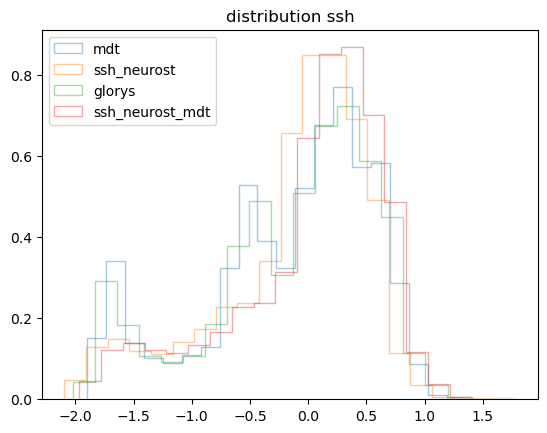

In [ ]:
plt.hist(mdt.mean_zos.values.ravel(),20,alpha=0.4,density=True,label='mdt',histtype='step')
plt.hist(ssh_neurost.zos.values.ravel(),20,alpha=0.4,density=True,label='ssh_neurost',histtype='step')
plt.hist(ssh_glorys.zos.values.ravel(),20,alpha=0.4,density=True,label='glorys',histtype='step')
plt.hist(ssh_neurost_mdt.zos.values.ravel(),20,alpha=0.4,density=True,label='ssh_neurost_mdt',histtype='step')
plt.title("distribution ssh")
plt.legend()

(array([1.01059355e-01, 2.82594184e-01, 1.80334181e-01, 1.05323242e-01,
        9.09148759e-02, 1.16331862e-01, 2.72052675e-01, 4.13095145e-01,
        3.53324160e-01, 3.40785839e-01, 5.70808825e-01, 7.18018195e-01,
        7.03214093e-01, 5.81818826e-01, 4.01197986e-01, 9.33323491e-02,
        2.73000729e-02, 4.21875184e-03, 6.77156427e-04, 1.22449769e-04]),
 array([-1.95502481, -1.76833658, -1.58164836, -1.39496013, -1.20827191,
        -1.02158368, -0.83489546, -0.64820723, -0.46151901, -0.27483078,
        -0.08814256,  0.09854567,  0.2852339 ,  0.47192212,  0.65861035,
         0.84529857,  1.0319868 ,  1.21867502,  1.40536325,  1.59205147,
         1.7787397 ]),
 [<matplotlib.patches.Polygon at 0x701260f93010>])

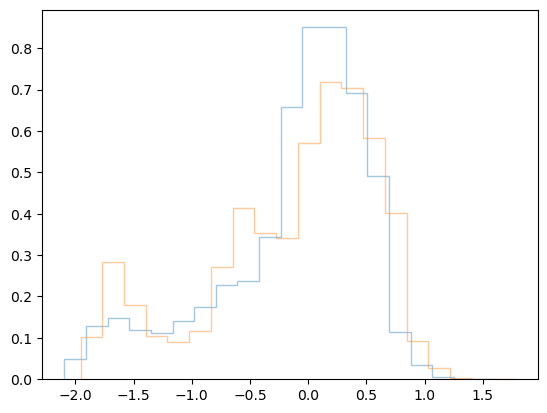

In [35]:
plt.hist(ssh_neurost.zos.values.ravel(),20,alpha=0.4,density=True,label='ssh_neurost',histtype='step')
plt.hist(ssh_duacs.zos.values.ravel(),20,alpha=0.4,density=True,label='ssh_neurost',histtype='step')

In [61]:
np.nanmean(ssh_duacs.zos.values) - np.nanmean(ssh_neurost.zos.values)

0.15209257311902918

In [58]:
ssh_duacs.zos[:-1,:,:] = xr.where(np.isnan(ssh_neurost.zos),np.nan,ssh_duacs.zos[:-1,:,:])

In [59]:
mean_err = np.nanmean((ssh_neurost.zos-ssh_duacs.zos).values,axis=0)

/tmp/ipykernel_2939620/3679350279.py:1: RuntimeWarning: Mean of empty slice
  mean_err = np.nanmean((ssh_neurost.zos-ssh_duacs.zos).values,axis=0)


In [60]:
mean_err

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

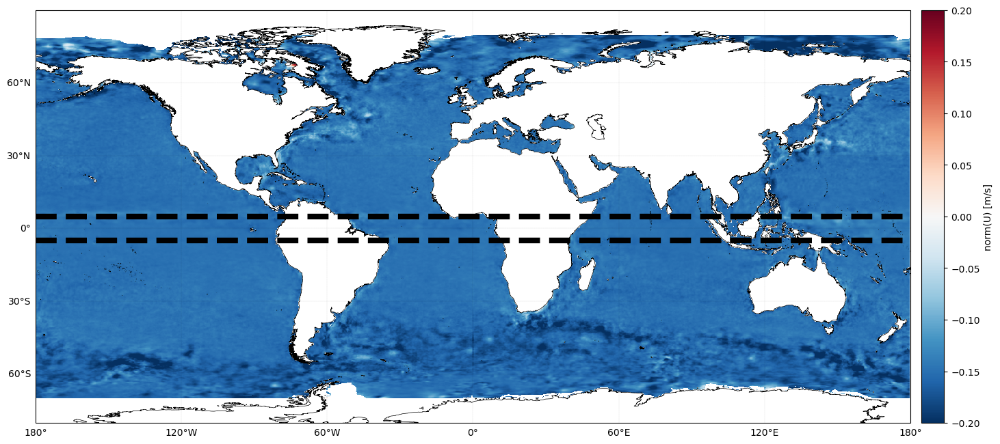

In [43]:
plot_uv_map(mean_err,lon,lat,vmin=-0.2,vmax=0.2)

In [51]:
np.where(mean_err > 0.1)

(array([ 40,  40,  40,  40,  40,  40,  40,  40,  40,  40,  40, 587, 587,
        588, 588, 588, 588, 588, 588, 588, 589, 589, 589, 589, 589, 589,
        589, 590, 590]),
 array([485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 426, 427,
        423, 424, 425, 426, 427, 428, 429, 423, 424, 425, 426, 427, 428,
        429, 427, 428]))

In [47]:
mean_err[40,478:510]

array([0.0299404 , 0.05159642, 0.05381881, 0.0570616 , 0.0647681 ,
       0.07599226, 0.08909686, 0.1015146 , 0.11148771, 0.11941788,
       0.12254385, 0.12138594, 0.11796295, 0.11252499, 0.10957225,
       0.10820814, 0.10612351, 0.10311284, 0.0997798 , 0.09517924,
       0.09043676, 0.08545317, 0.07938388, 0.07231478, 0.06504137,
       0.05766022, 0.05026546, 0.04259072, 0.03496414, 0.02655841,
       0.01827961, 0.00966795])